In [1]:
import collections
import datetime
import fluidsynth
import glob
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import pretty_midi
import os
from IPython import display
from matplotlib import pyplot as plt
from typing import Dict, List, Optional, Sequence, Tuple

C:\Windows\system32\libfluidsynth.dll


In [2]:
seed=1234
tf.random.set_seed(seed)
np.random.seed(seed)

_SAMPLING_RATE=44100

In [3]:
filenames = glob.glob(str(r"C:\Users\moonp\ASAC과정\MIDI_DATA\total_midi\*.mid*"))
print('Number of files:', len(filenames))

Number of files: 4


In [4]:
sample_file = filenames[0]
print(sample_file)

C:\Users\moonp\ASAC과정\MIDI_DATA\total_midi\01.mid


In [5]:
pm = pretty_midi.PrettyMIDI(sample_file)

In [6]:
def display_audio(pm: pretty_midi.PrettyMIDI, seconds=30):
  waveform = pm.fluidsynth(fs=_SAMPLING_RATE)
  # Take a sample of the generated waveform to mitigate kernel resets
  waveform_short = waveform[:seconds*_SAMPLING_RATE]
  return display.Audio(waveform_short, rate=_SAMPLING_RATE)

In [7]:
display_audio(pm)

In [8]:
tmp=pm

In [9]:
print('Number of instruments:', len(tmp.instruments))
tmp_inst=[]
for i in range(len(tmp.instruments)):
    instrument = tmp.instruments[i]
    instrument_name = pretty_midi.program_to_instrument_name(instrument.program)
    print('Instrument name:', instrument_name)
    tmp_inst.append(tmp.instruments[i].program)

Number of instruments: 1
Instrument name: Acoustic Grand Piano


In [10]:
for i, note in enumerate(instrument.notes[:10]):
  note_name = pretty_midi.note_number_to_name(note.pitch)
  duration = note.end - note.start
  print(f'{i}: pitch={note.pitch}, note_name={note_name},'
        f' duration={duration:.4f}')

0: pitch=69, note_name=A4, duration=0.2490
1: pitch=72, note_name=C5, duration=0.2490
2: pitch=71, note_name=B4, duration=0.2490
3: pitch=76, note_name=E5, duration=0.2490
4: pitch=68, note_name=G#4, duration=0.2490
5: pitch=72, note_name=C5, duration=0.2490
6: pitch=71, note_name=B4, duration=0.2490
7: pitch=76, note_name=E5, duration=0.2490
8: pitch=67, note_name=G4, duration=0.2490
9: pitch=72, note_name=C5, duration=0.2490


In [11]:
def midi_to_notes(midi_file: str) -> pd.DataFrame:
  pm = pretty_midi.PrettyMIDI(midi_file)
  instrument = pm.instruments[0]
  notes = collections.defaultdict(list)

  # Sort the notes by start time
  sorted_notes = sorted(instrument.notes, key=lambda note: note.start)
  prev_start = sorted_notes[0].start

  for note in sorted_notes:
    start = note.start
    end = note.end
    notes['pitch'].append(note.pitch)
    notes['start'].append(start)
    notes['end'].append(end)
    notes['step'].append(start - prev_start)
    notes['duration'].append(end - start)
    prev_start = start

  return pd.DataFrame({name: np.array(value) for name, value in notes.items()})

In [12]:
raw_notes = midi_to_notes(sample_file)
raw_notes.head()

,pitch,start,end,step,duration
0,69,0.00,0.248958,0.00,0.248958
1,72,0.25,0.498958,0.25,0.248958
2,71,0.50,0.748958,0.25,0.248958
3,76,0.75,0.998958,0.25,0.248958
4,68,1.00,1.248958,0.25,0.248958


In [13]:
get_note_names = np.vectorize(pretty_midi.note_number_to_name)
sample_note_names = get_note_names(raw_notes['pitch'])
sample_note_names[:10]

array(['A4', 'C5', 'B4', 'E5', 'G#4', 'C5', 'B4', 'E5', 'G4', 'C5'],
      dtype='<U3')

In [14]:
def plot_piano_roll(notes: pd.DataFrame, count: Optional[int] = None):
  if count:
    title = f'First {count} notes'
  else:
    title = f'Whole track'
    count = len(notes['pitch'])
  plt.figure(figsize=(20, 4))
  plot_pitch = np.stack([notes['pitch'], notes['pitch']], axis=0)
  plot_start_stop = np.stack([notes['start'], notes['end']], axis=0)
  plt.plot(
      plot_start_stop[:, :count], plot_pitch[:, :count], color="b", marker=".")
  plt.xlabel('Time [s]')
  plt.ylabel('Pitch')
  _ = plt.title(title)

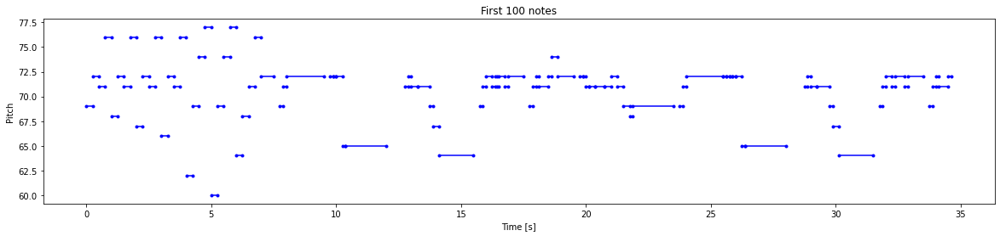

In [15]:
plot_piano_roll(raw_notes, count=100)

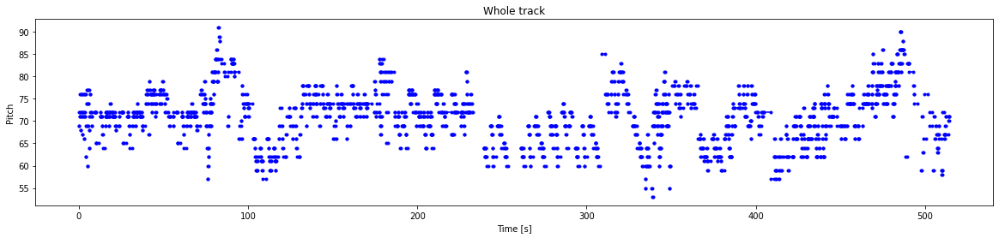

In [16]:
plot_piano_roll(raw_notes)

In [17]:
def plot_distributions(notes: pd.DataFrame, drop_percentile=2.5):
  plt.figure(figsize=[15, 5])
  plt.subplot(1, 3, 1)
  sns.histplot(notes, x="pitch", bins=20)

  plt.subplot(1, 3, 2)
  max_step = np.percentile(notes['step'], 100 - drop_percentile)
  sns.histplot(notes, x="step", bins=np.linspace(0, max_step, 21))

  plt.subplot(1, 3, 3)
  max_duration = np.percentile(notes['duration'], 100 - drop_percentile)
  sns.histplot(notes, x="duration", bins=np.linspace(0, max_duration, 21))

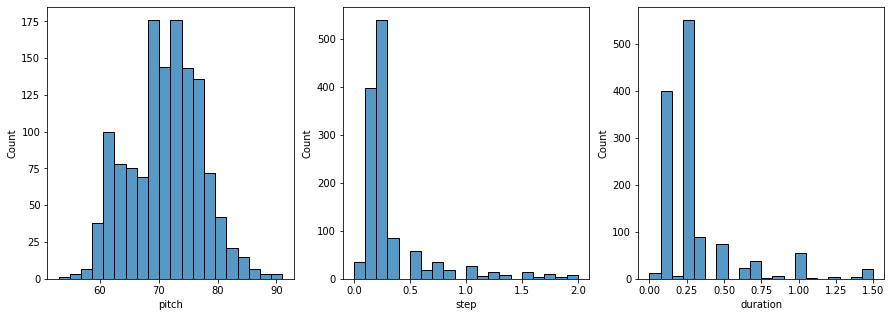

In [18]:
plot_distributions(raw_notes)

In [19]:
def notes_to_midi(
  notes: pd.DataFrame,
  out_file: str, 
  instrument_name: str,
  velocity: int = 100,  # note loudness
) -> pretty_midi.PrettyMIDI:

  pm = pretty_midi.PrettyMIDI()
  instrument = pretty_midi.Instrument(
      program=pretty_midi.instrument_name_to_program(
          instrument_name))

  prev_start = 0
  for i, note in notes.iterrows():
    start = float(prev_start + note['step'])
    end = float(start + note['duration'])
    note = pretty_midi.Note(
        velocity=velocity,
        pitch=int(note['pitch']),
        start=start,
        end=end,
    )
    instrument.notes.append(note)
    prev_start = start

  pm.instruments.append(instrument)
  pm.write(out_file)
  return pm

In [20]:
example_file = 'example.midi'
example_pm = notes_to_midi(
    raw_notes, out_file=example_file, instrument_name=instrument_name)

In [21]:
display_audio(example_pm)

In [54]:
n=500
compare_file = 'compare.midi'
compare_pm = notes_to_midi(
    raw_notes[n:], out_file=example_file, instrument_name=instrument_name)
display_audio(compare_pm)

In [55]:
display_audio(compare_pm)

In [22]:
example_pm.instruments

[Instrument(program=0, is_drum=False, name="")]

In [23]:
num_files = 4
all_notes = []
for f in filenames[:num_files]:
  notes = midi_to_notes(f)
  all_notes.append(notes)

all_notes = pd.concat(all_notes)

In [24]:
n_notes = len(all_notes)
print('Number of notes parsed:', n_notes)

Number of notes parsed: 11005


In [25]:
key_order = ['pitch', 'step', 'duration']
train_notes = np.stack([all_notes[key] for key in key_order], axis=1)

In [26]:
notes_ds = tf.data.Dataset.from_tensor_slices(train_notes)
notes_ds.element_spec

TensorSpec(shape=(3,), dtype=tf.float64, name=None)

In [27]:
def create_sequences(
    dataset: tf.data.Dataset, 
    seq_length: int,
    vocab_size = 128,
) -> tf.data.Dataset:
  """Returns TF Dataset of sequence and label examples."""
  seq_length = seq_length+1

  # Take 1 extra for the labels
  windows = dataset.window(seq_length, shift=1, stride=1,
                              drop_remainder=True)

  # `flat_map` flattens the" dataset of datasets" into a dataset of tensors
  flatten = lambda x: x.batch(seq_length, drop_remainder=True)
  sequences = windows.flat_map(flatten)

  # Normalize note pitch
  def scale_pitch(x):
    x = x/[vocab_size,1.0,1.0]
    return x

  # Split the labels
  def split_labels(sequences):
    inputs = sequences[:-1]
    labels_dense = sequences[-1]
    labels = {key:labels_dense[i] for i,key in enumerate(key_order)}

    return scale_pitch(inputs), labels

  return sequences.map(split_labels, num_parallel_calls=tf.data.AUTOTUNE)

In [28]:
seq_length = 25
vocab_size = 128
seq_ds = create_sequences(notes_ds, seq_length, vocab_size)
seq_ds.element_spec

(TensorSpec(shape=(25, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(), dtype=tf.float64, name=None)})

In [29]:
for seq, target in seq_ds.take(1):
  print('sequence shape:', seq.shape)
  print('sequence elements (first 10):', seq[0: 10])
  print()
  print('target:', target)

sequence shape: (25, 3)
sequence elements (first 10): tf.Tensor(
[[0.5390625  0.         0.24895833]
 [0.5625     0.25       0.24895833]
 [0.5546875  0.25       0.24895833]
 [0.59375    0.25       0.24895833]
 [0.53125    0.25       0.24895833]
 [0.5625     0.25       0.24895833]
 [0.5546875  0.25       0.24895833]
 [0.59375    0.25       0.24895833]
 [0.5234375  0.25       0.24895833]
 [0.5625     0.25       0.24895833]], shape=(10, 3), dtype=float64)

target: {'pitch': <tf.Tensor: shape=(), dtype=float64, numpy=68.0>, 'step': <tf.Tensor: shape=(), dtype=float64, numpy=0.25>, 'duration': <tf.Tensor: shape=(), dtype=float64, numpy=0.2489583333333334>}


In [30]:
batch_size = 64
buffer_size = n_notes - seq_length  # the number of items in the dataset
train_ds = (seq_ds
            .shuffle(buffer_size)
            .batch(batch_size, drop_remainder=True)
            .cache()
            .prefetch(tf.data.experimental.AUTOTUNE))

In [31]:
train_ds.element_spec

(TensorSpec(shape=(64, 25, 3), dtype=tf.float64, name=None),
 {'pitch': TensorSpec(shape=(64,), dtype=tf.float64, name=None),
  'step': TensorSpec(shape=(64,), dtype=tf.float64, name=None),
  'duration': TensorSpec(shape=(64,), dtype=tf.float64, name=None)})

In [32]:
def mse_with_positive_pressure(y_true: tf.Tensor, y_pred: tf.Tensor):
  mse = (y_true - y_pred) ** 2
  positive_pressure = 10 * tf.maximum(-y_pred, 0.0)
  return tf.reduce_mean(mse + positive_pressure)

In [33]:
input_shape = (seq_length, 3)
learning_rate = 0.001

inputs = tf.keras.Input(input_shape)
lstm1 = tf.keras.layers.LSTM(128,return_sequences=True)(inputs)
d1=tf.keras.layers.Dropout(0.5)(lstm1)
lstm2 = tf.keras.layers.LSTM(128)(d1)
d2=tf.keras.layers.Dropout(0.5)(lstm2)
dense1=tf.keras.layers.Dense(128)(d2)

outputs = {
  'pitch': tf.keras.layers.Dense(128, name='pitch')(dense1),
  'step': tf.keras.layers.Dense(1, name='step')(dense1),
  'duration': tf.keras.layers.Dense(1, name='duration')(dense1),
}

model = tf.keras.Model(inputs, outputs)

loss = {
      'pitch': tf.keras.losses.SparseCategoricalCrossentropy(
          from_logits=True),
      'step': mse_with_positive_pressure,
      'duration': mse_with_positive_pressure,
}

optimizer = tf.keras.optimizers.Adam(learning_rate=learning_rate)

model.compile(loss=loss, optimizer=optimizer)

model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 25, 3)]      0                                            
__________________________________________________________________________________________________
lstm (LSTM)                     (None, 25, 128)      67584       input_1[0][0]                    
__________________________________________________________________________________________________
dropout (Dropout)               (None, 25, 128)      0           lstm[0][0]                       
__________________________________________________________________________________________________
lstm_1 (LSTM)                   (None, 128)          131584      dropout[0][0]                    
______________________________________________________________________________________________

In [34]:
losses = model.evaluate(train_ds, return_dict=True)
losses

171/171 [==============================] - 8s 9ms/step - loss: 6.3791 - duration_loss: 0.4434 - pitch_loss: 4.8632 - step_loss: 1.0725


{'loss': 6.561916828155518,
 'duration_loss': 0.4367389678955078,
 'pitch_loss': 4.863387107849121,
 'step_loss': 1.2617902755737305}

In [35]:
losses["duration_loss"]

0.4367389678955078

In [37]:
model.compile(
    loss=loss,
    loss_weights={
        'pitch': 0.1,
        'step': 1/4,
        'duration':1,
    },
    optimizer=optimizer,
)

In [38]:
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(
        filepath='./training_checkpoints/ckpt_{epoch}',
        save_weights_only=True),
    tf.keras.callbacks.EarlyStopping(
        monitor='loss',
        patience=10,
        verbose=1,
        restore_best_weights=True),
]

In [39]:
%%time
epochs = 1000

history = model.fit(
    train_ds,
    epochs=epochs,
    callbacks=callbacks,
)

Epoch 1/100
171/171 [==============================] - 5s 16ms/step - loss: 0.7716 - duration_loss: 0.2431 - pitch_loss: 4.1140 - step_loss: 0.4686
Epoch 2/100
171/171 [==============================] - 3s 17ms/step - loss: 0.5956 - duration_loss: 0.2096 - pitch_loss: 2.8532 - step_loss: 0.4028
Epoch 3/100
171/171 [==============================] - 3s 18ms/step - loss: 0.5683 - duration_loss: 0.2046 - pitch_loss: 2.8292 - step_loss: 0.3229
Epoch 4/100
171/171 [==============================] - 3s 16ms/step - loss: 0.5535 - duration_loss: 0.2030 - pitch_loss: 2.8170 - step_loss: 0.2752
Epoch 5/100
171/171 [==============================] - 3s 15ms/step - loss: 0.5473 - duration_loss: 0.2008 - pitch_loss: 2.8107 - step_loss: 0.2615
Epoch 6/100
171/171 [==============================] - 3s 16ms/step - loss: 0.5443 - duration_loss: 0.1993 - pitch_loss: 2.8017 - step_loss: 0.2594
Epoch 7/100
171/171 [==============================] - 3s 16ms/step - loss: 0.5409 - duration_loss: 0.1979 - pit

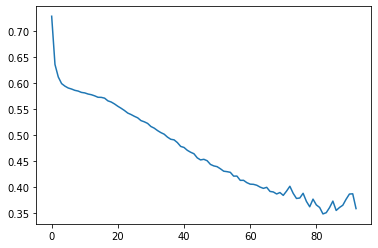

In [40]:
plt.plot(history.epoch, history.history['loss'], label='total loss')
plt.show()

In [47]:
def predict_next_note(
    notes: np.ndarray, 
    keras_model: tf.keras.Model, 
    temperature: float = 1.0) -> int:
  """Generates a note IDs using a trained sequence model."""

  assert temperature > 0

  # Add batch dimension
  inputs = tf.expand_dims(notes, 0)

  predictions = model.predict(inputs)
  pitch_logits = predictions['pitch']
  step = predictions['step']
  duration = predictions['duration']

  pitch_logits /= temperature
  pitch = tf.random.categorical(pitch_logits, num_samples=1)
  pitch = tf.squeeze(pitch, axis=-1)
  duration = tf.squeeze(duration, axis=-1)
  step = tf.squeeze(step, axis=-1)

  # # `step` and `duration` values should be non-negative
  # step = tf.maximum(0, step)
  duration = tf.maximum(0, duration)

  return int(pitch), float(step), float(duration)

In [60]:
temperature = 2.0
num_predictions = 1200
sample_notes = np.stack([raw_notes[key] for key in key_order], axis=1)
n=0
# The initial sequence of notes; pitch is normalized similar to training
# sequences
input_notes = (
    sample_notes[n:n+seq_length] / np.array([vocab_size, 1, 1]))

generated_notes = []
prev_start = 0
for _ in range(num_predictions):
  pitch, step, duration = predict_next_note(input_notes, model, temperature)
  start = prev_start + step
  end = start + duration
  input_note = (pitch, step, duration)
  generated_notes.append((*input_note, start, end))
  input_notes = np.delete(input_notes, 0, axis=0)
  input_notes = np.append(input_notes, np.expand_dims(input_note, 0), axis=0)
  prev_start = start

generated_notes = pd.DataFrame(
    generated_notes, columns=(*key_order, 'start', 'end'))

In [61]:
generated_notes.head(10)

,pitch,step,duration,start,end
0,70,0.274588,0.300641,0.274588,0.575229
1,86,0.249796,0.311989,0.524384,0.836372
2,83,0.281567,0.439787,0.805950,1.245738
3,88,0.261241,0.529745,1.067192,1.596937
4,85,0.260164,0.557495,1.327356,1.884851
5,76,0.265145,0.561591,1.592501,2.154092
6,86,0.274841,0.553184,1.867342,2.420526
7,83,0.283906,0.549241,2.151248,2.700488
8,81,0.289380,0.541646,2.440628,2.982274
9,90,0.291378,0.537564,2.732006,3.269569


In [62]:
out_file = 'output.mid'
out_pm = notes_to_midi(
    generated_notes, out_file=out_file, instrument_name=instrument_name)
display_audio(out_pm)

In [63]:
compare_file = 'compare.midi'
compare_pm = notes_to_midi(
    raw_notes[n:], out_file=example_file, instrument_name=instrument_name)
display_audio(compare_pm)

In [58]:
train_ds

<PrefetchDataset shapes: ((64, 25, 3), {pitch: (64,), step: (64,), duration: (64,)}), types: (tf.float64, {pitch: tf.float64, step: tf.float64, duration: tf.float64})>

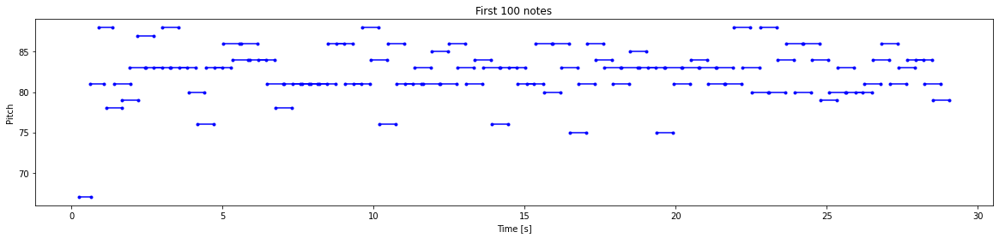

In [59]:
plot_piano_roll(generated_notes, count=100)